# Universidade de Brasília
Faculdade de Tecnologia

Departamento de Engenharia Mecânica

Disciplina: VISÃO COMPUTACIONAL – PPMEC3617

Professor: José Maurício S. T. Motta

Aluno: Judah Holanda Correia Lima (252112485)

Período: 2025/2

1º Trabalho de Avaliação

# 1

## a)
Estime o ruído de seu sistema de aquisição de imagens (pode ser uma webcamera ou qualquer outra) usando os passos propostos no algoritmo EST_NOISE e AUTO_COVARIANCE, expostos nos slides em sala de aula. Você precisará capturar diversas imagens da mesma cena estática, em um ambiente sem variações de iluminação (lâmpadas fluorescentes afetam a iluminação das imagens, bem como imagens externas de nuvens e árvores, sendo indicada cena interna e com fixação perfeita da câmera), plotando depois o gráfico da intensidade da imagem ao longo de uma linha e a variação produzida pelo ruído. Esta variação deverá ser pequena, da ordem de menos de 5% em geral, dependendo da qualidade da câmera. Discuta os resultados.

### ALGORITMO EST_NOISE

- Temos n imagens da mesma cena:

$$
(E₀, E₁, …, E_{n-1})
$$

#### Média em cada pixel:

$$
\overline{E(i, j)} = \frac{1}{n} ∑_{k=0}^{n-1} E_k(i, j)
$$

#### Desvio padrão em cada pixel:

$$
σ(i, j) = \sqrt{\frac{1}{n-1} ∑_{k=0}^{n-1} \big(\overline{E(i, j)} - E_k(i, j)\big)^2}
$$

#### Média do desvio padrão para a imagem inteira:

$$
\bar{σ} = \frac{1}{N · N} ∑_{i=0}^{N-1} ∑_{j=0}^{N-1} σ(i, j)
$$

#### Mundo Real

No entanto a imagem não necessariamente tem o mesmo tamanho na largura(W) e altura(H)

Então podemos reescrever como:

Para cada pixel \((i, j)\), com
(i = 0, …, W - 1) e (j = 0, …, L - 1):

#### Média do desvio padrão para toda a imagem:

$$
\bar{σ} = \frac{1}{W · L} ∑_{i=0}^{W-1} ∑_{j=0}^{L-1} σ(i, j)
$$

### AUTO_COVARIANCE:
- $$c = 1/N^2$$
- $$(N_{i'} = N - i' - 1)$$
- $$(N_{j'} = N - j' - 1)$$

For each \(i', j' = 0, …, N - 1\):
$$
C_{EE}(i', j') = c · ∑_{i=0}^{N_{i'}} ∑_{j=0}^{N_{j'}} (E(i, j) - \overline{E(i, j)}) · (E(i + i', j + j') - \overline{E(i + i', j + j')})
$$

#### Mundo Real

No entanto a imagem não necessariamente tem o mesmo tamanho na largura(W) e altura(H)

Então podemos reescrever como:

- $$c = 1/(L · H)$$
- $$(W_{i'} = W - i' - 1)$$
- $$(H_{j'} = H - j' - 1)$$

For each \(i' = 0, …, W - 1\) and  \(j' = 0, …, H - 1\):
$$
C_{EE}(i', j') = c · ∑_{i=0}^{W_{i'}} ∑_{j=0}^{H_{j'}} (E(i, j) - \overline{E(i, j)}) · (E(i + i', j + j') - \overline{E(i + i', j + j')})
$$

Como
$$
(E(i, j) - \overline{E(i, j)})
$$
Não varia em relação a i' e j', podemos colocar de fora do somatório, pois o somatório de uma constante por cada elemento é o mesmo que o a constante vezes somatório de cada elemento.

$$
C_{EE}(i', j') = c · (E(i, j) - \overline{E(i, j)}) · ∑_{i=0}^{W_{i'}} ∑_{j=0}^{H_{j'}} (E(i + i', j + j') - \overline{E(i + i', j + j')})
$$

E também é possivel escrever como:
$$
C_{EE}(i', j') = c · (E(i, j) - \overline{E(i, j)}) · ((∑_{i=0}^{W_{i'}} ∑_{j=0}^{H_{j'}} (E(i + i', j + j')) - (∑_{i=0}^{W_{i'}} ∑_{j=0}^{H_{j'}} \overline{E(i + i', j + j')})))
$$
Ou ainda:
A variação das imagens:
$$
V(i, j) = E(i, j) - \overline{E(i, j)}
$$
A soma de todos os vizinhos de cada ponto:
$$
N(i, j) = ∑_{i=0}^{W_{i'}} ∑_{j=0}^{H_{j'}} E(i + i', j + j')
$$
A Média da soma de todos os vizinhos de cada ponto:
$$
\overline{N(i, j)} = ∑_{i=0}^{W_{i'}} ∑_{j=0}^{H_{j'}} \overline{E(i + i', j + j')}
$$
Resultando na covariancia:
$$
C_{EE}(i', j') = c · V(i, j) · (N(i, j) - \overline{N(i, j)})
$$

In [ ]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize

def get_images(folder):
    files = [
        os.path.join(folder, f)
        for f in os.listdir(folder)
        if f.lower().endswith((".png", ".jpg", ".jpeg", ".bmp", ".npz"))
    ]

    if not files:
        raise ValueError("Nenhuma imagem encontrada na pasta.")

    first_file = files[0]

    if first_file.lower().endswith(".npz"):
        # Carrega o arquivo npz
        data = np.load(first_file)
        # Se soubermos que a chave é "resultado"
        if "resultado" in data:
            arr = data["resultado"]
        else:
            # caso contrário, pega a primeira chave disponível
            key = list(data.keys())[0]
            arr = data[key]

        height, width = arr.shape[:2]

    else:
        # Carregar como imagem comum
        img_ref = Image.open(first_file).convert("RGB")
        width, height = img_ref.size

    return {
        "files": files,
        "width": width,
        "height": height
    }

def image_to_array(file, width=None, height=None):
    if file.lower().endswith(".npz"):
        # Carregar npz
        data = np.load(file)
        # se tiver a chave "resultado", usa ela. Se não, pega a primeira existente
        arr = data["resultado"] if "resultado" in data else data[list(data.keys())[0]]

        # garantir dtype float64
        np_img = np.array(arr, dtype=np.float64)

        if width is not None and height is not None:
            # Se precisar forçar resize (padrão igual ao das imagens PIL)
            if (np_img.shape[1], np_img.shape[0]) != (width, height):
                np_img = resize(
                    np_img, (height, width, np_img.shape[2]), preserve_range=True
                ).astype(np.float64)

    else:
        # Imagem regular
        img = Image.open(file).convert("RGB")
        if width is not None and height is not None:
            img = img.resize((width, height))
        np_img = np.array(img, dtype=np.float64)

    return np_img


def save_image(output, name, img_type):
    name = f"{name}.{img_type}"
    if img_type.lower() == "npz":
        np.savez_compressed(name, resultado=output)
    else:
        output = np.clip(output, 0, 255).astype(np.uint8)
        # Salva a imagem média
        img_final = Image.fromarray(output, mode="RGB")
        img_final.save(name)
    print(f"Imagem salva como {name}")


def average_images(folder, output="average", img_type="png"):
    images = get_images(folder)
    files = images["files"]
    width = images["width"]
    height = images["height"]

    # Acumula as imagens em numpy arrays
    sum = np.zeros((height, width, 3), dtype=np.float64)

    index = 0
    for file in files:
        np_img = image_to_array(file, width, height)
        # print(f'Imagem-{index}')
        # print(np_img)
        sum += np_img
        index += 1

    # print('Soma')
    # print(sum)

    avg = sum / len(files)

    # print('Media')
    # print(avg)

    save_image(avg, output, img_type)


def variation_images(folder, avg="average", output="variation/", img_type="png"):
    images = get_images(folder)
    files = images["files"]
    width = images["width"]
    height = images["height"]
    avg_name = f"{avg}.{img_type}"
    # garantir tamanho
    avg_img = image_to_array(avg_name, width, height)

    index = 0
    for file in files:
        np_img = image_to_array(file, width, height)
        # print(f'Imagem-{index}')
        # print(np_img)
        sub = np_img - avg_img

        name = f'{output}{index}'
        save_image(sub, name, img_type)
        index += 1


def neighbors_images(folder, output="neighbors/"):
    images = get_images(folder)
    files = images["files"]
    width = images["width"]
    height = images["height"]
    # garantir tamanho

    index = 0
    for file in files:
        # garantir tamanho
        img = image_to_array(file, width, height)
        # Soma total de todos os pixels (por canal)
        soma_total = np.sum(img, axis=(0, 1))  # vetor [R_total, G_total, B_total]

        # Para cada pixel, o novo valor é soma_total - pixel_atual
        resultado = soma_total - img

        name = f'{output}{index}'
        save_image(resultado, name, 'npz')
        index += 1


def deviation_images(folder, avg="average.png", output="deviation", image_type="png"):
    images = get_images(folder)
    files = images["files"]
    width = images["width"]
    height = images["height"]

    # Acumula as imagens em numpy arrays
    sum = np.zeros((height, width, 3), dtype=np.float64)
    # garantir tamanho
    avg_img = image_to_array(avg, width, height)

    index = 0
    for file in files:
        # garantir tamanho
        np_img = image_to_array(file, width, height)
        # print(f'Imagem-{index}')
        # print(np_img)
        sub = avg_img - np_img
        pow = sub ** 2
        sum += pow
        index += 1

    # print('Soma')
    # print(sum)

    avg = sum / len(files)

    # print('Media')
    # print(avg)

    root = avg ** 0.5

    # print('Raiz')
    # print(root)

    save_image(root, output, image_type)


def covariance_image(variation_folder="variation", neighbors_folder="neighbors", neighbors_average="neighbors_average.npz", output="covariance/", img_type="png"):
    variation_images = get_images(variation_folder)
    variation_files = variation_images["files"]
    width = variation_images["width"]
    height = variation_images["height"]
    neighbors_images = get_images(neighbors_folder)
    neighbors_files = neighbors_images["files"]
    n_np_img_avg = image_to_array(neighbors_average, width, height)
    c = 1 / (width * height)

    s = len(variation_files)
    if s != len(variation_files):
        raise Exception("Size Error")

    index = 0
    for index in range(0, s):
        variation_file = variation_files[index]
        neighbors_file = neighbors_files[index]

        v_np_img = image_to_array(variation_file, width, height)
        n_np_img = image_to_array(neighbors_file, width, height)

        result = n_np_img - n_np_img_avg
        result = result * v_np_img
        result = result * c
        name = f"{output}{index}"
        save_image(result, name, img_type)




def image_average(input="deviation.png"):
    img = image_to_array(input)
    avg = np.mean(img)
    print(f"Media da imagem {input}: {avg}")
    return avg


def get_arrays(folder, add=["average.png"]):
    images = get_images(folder)
    files: list = images["files"]
    width = images["width"]
    height = images["height"]
    for e in add:
        files.append(e)
    a: list = []
    for file in files:
        print(file)
        np_image = image_to_array(file, width, height)
        a.append(np_image)
    return a


def plot_gray(imgs, output="graf.png"):
    """
    Plota em escala de cinza todas as imagens e a média.
    NÃO inclui o desvio.
    """
    idx_media = len(imgs) - 1  # média é última

    plt.figure(figsize=(12, 6))

    for i, img in enumerate(imgs):
        gray = img.mean(axis=2).flatten()

        if i == idx_media:  # destaque para média
            lw, alpha, estilo, nome, cor = 0.5, 1, "-", "media", "red"
        else:
            lw, alpha, estilo, nome, cor = 0.5, 1, "--", f"img{i}", "black"

        plt.plot(
            gray,
            color=cor,
            linestyle=estilo,
            lw=lw,
            alpha=alpha,
            label=nome if i == idx_media else None,
        )

    plt.title("Curvas em escala de cinza (imagens + média)")
    plt.xlabel("Índice do pixel (flattened)")
    plt.ylabel("Intensidade (0-255)")
    plt.legend()
    plt.grid(True)
    plt.savefig(output, dpi=300, bbox_inches="tight")
    plt.close()
    print(f"Gráfico (sem desvio) salvo em '{output}'")


def plot_desvio(img, output="graf_desvio.png"):
    """
    Plota apenas a imagem de desvio em grayscale.
    """
    gray = img.mean(axis=2).flatten()

    plt.figure(figsize=(12, 6))
    plt.plot(
        gray,
        color="black",
        linestyle="-",
        lw=0.5,
        label="desvio"
    )

    plt.title("Curva em escala de cinza (desvio)")
    plt.xlabel("Índice do pixel (flattened)")
    plt.ylabel("Intensidade (0-255)")
    plt.legend()
    plt.grid(True)
    plt.savefig(output, dpi=300, bbox_inches="tight")
    plt.close()
    print(f"Gráfico do desvio salvo em '{output}'")

def pixel_p(value):
    return (value / 255) * 100

average_images("pictures")
deviation_images("pictures")

dev = image_average()
dev_p = pixel_p(dev)


variation_images("pictures")
neighbors_images("pictures")
average_images("neighbors", "neighbors_average", "npz")

covariance_image()



var = image_average("variation_average.png")
var_p = pixel_p(var)

print(f"% do devio médio: {dev_p}")
print(f"% da variação média: {var_p}")

arrays = get_arrays("pictures")

plot_gray(arrays)
plot_desvio(image_to_array("deviation.png"))
plot_desvio(image_to_array("variation_average.png"), "graf_variation.png")

#### Media das imagens:

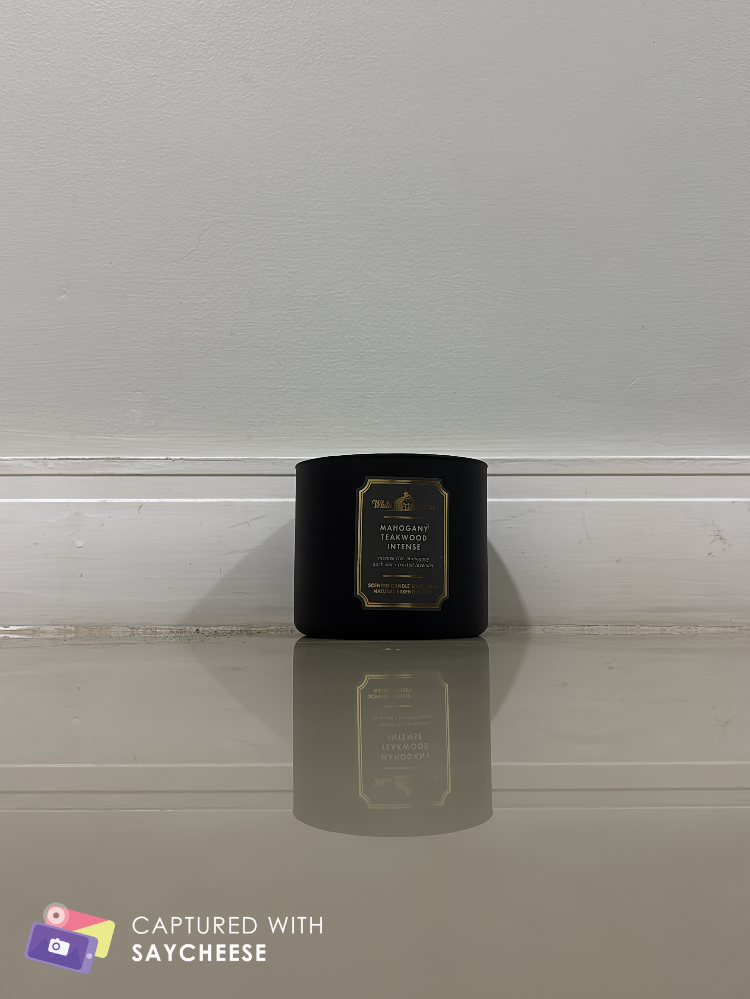

#### Imagem da média do desvio:
Como é todo pequeno, é todo preto

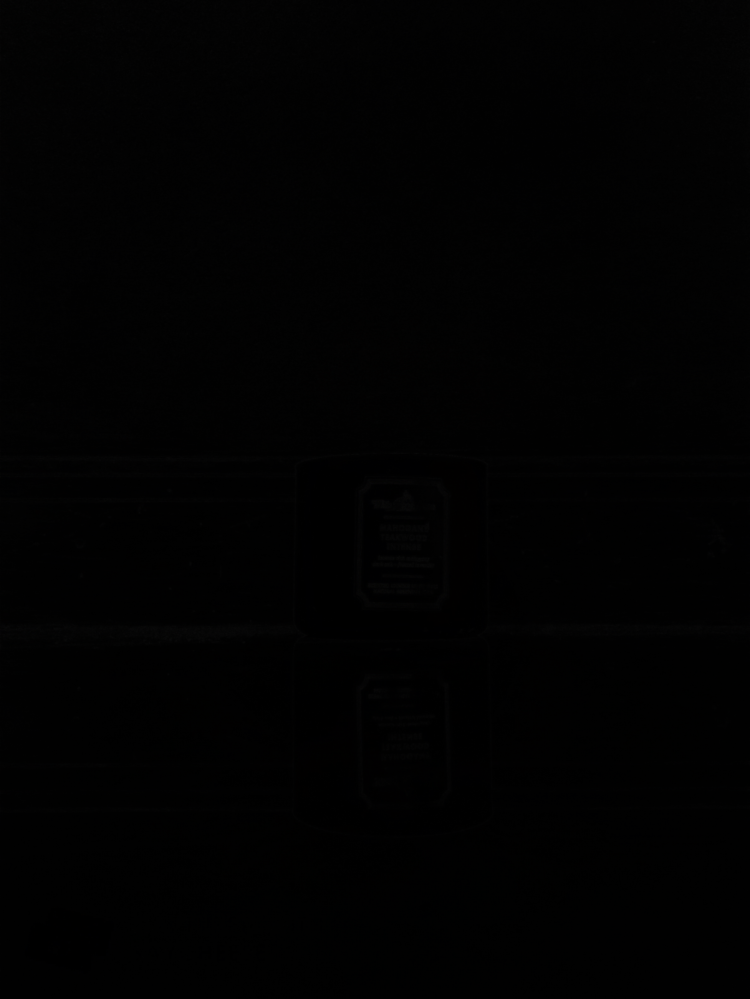

#### Imagem da média do desvio:
Como é todo pequeno, é todo preto

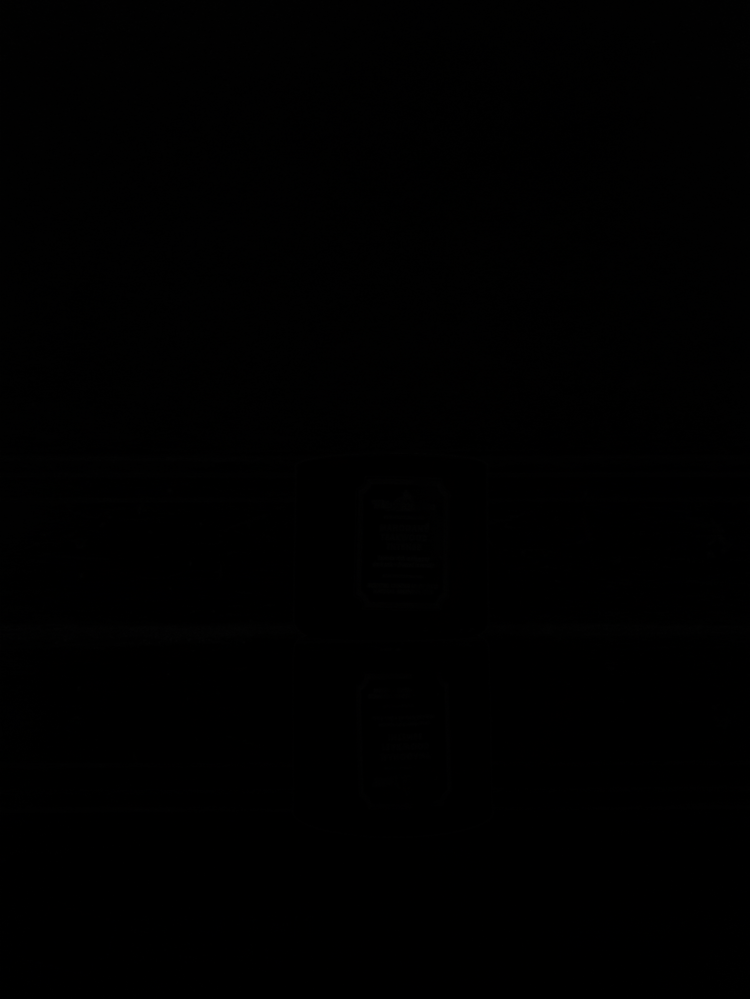

### Graficos:

#### Desvio:

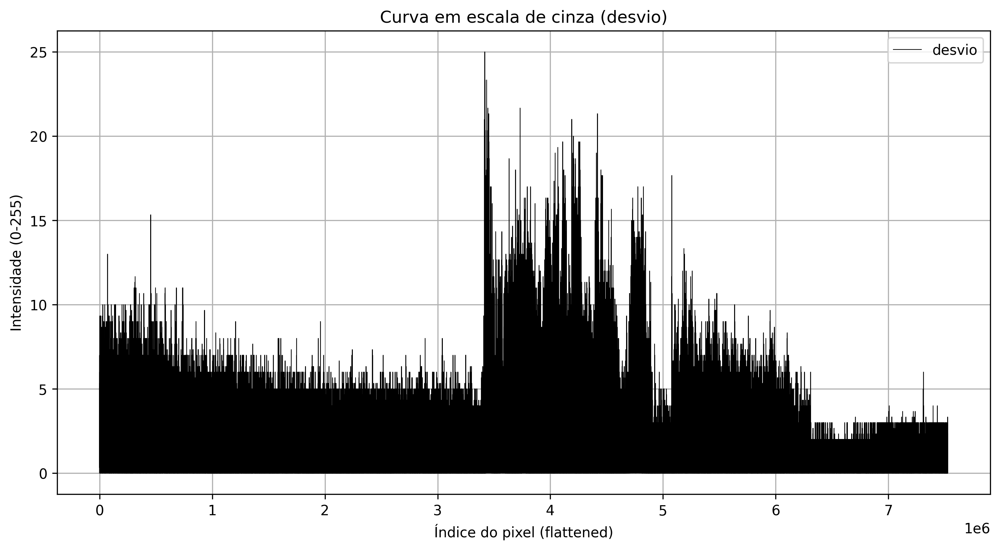

#### Variação:


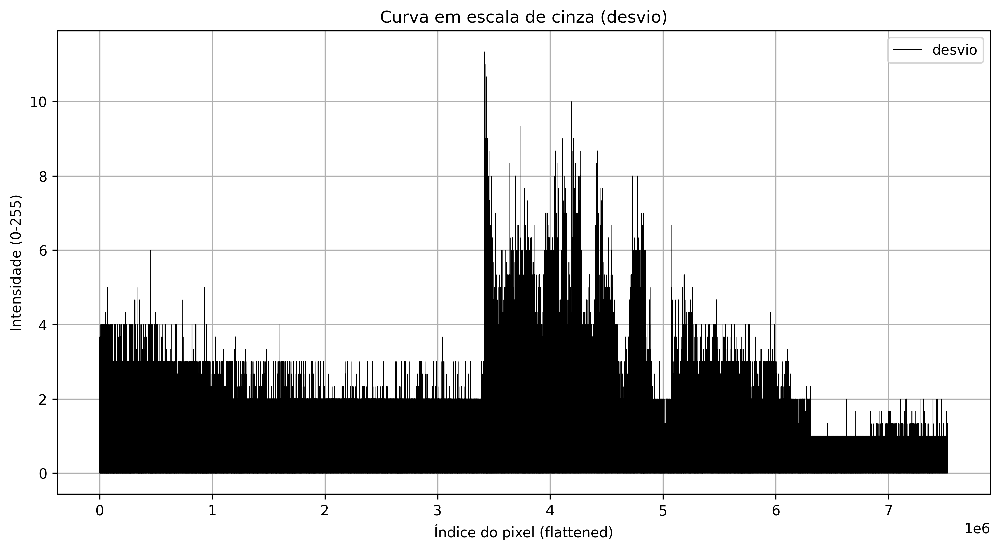

#### Total:

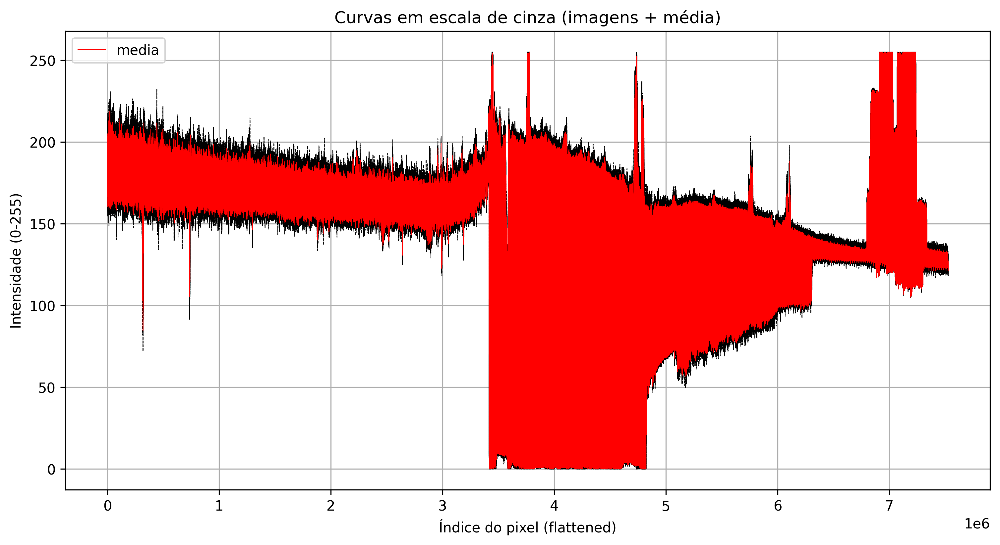

### Resultados:

Media da imagem deviation.png: 1.3016877440935732

Media da imagem variation_average.png: 0.44390546351562765

% do devio médio: 0.5104657819974797

% da variação média: 0.17408057392769713


### Comentários finais:

#### Média das imagens:

Ao calcular e vizualizar a média das imagens capturadas, obtivemos uma cena praticamente idêntica à original, assim é visível que o ruído não é tão alto ou tem um desvio alto.

#### Imagem da média do desvio:

A imagem resultante do desvio-padrão apresenta valores muito pequenos, o que a torna quase totalmente preta. Esse efeito mostra que a variação pixel a pixel entre as imagens é baixa, ou seja, o sensor da câmera apresenta ruído pequeno e estável.

#### Ruído médio:

Foi estimado que o desvio médio corresponde a aproximadamente a 1.3 ou 0.5% da intesidade máxima. E que a variação média é 0.4 ou 0.2% da intesidade máxima.

#### Gráficos da intensidade:


- A curva média acompanha bem o perfil das imagens originais, demonstrando que a média preserva os detalhes da cena.

- Já as curvas de desvio mostram pequenas flutuações ao longo da linha, indicando que o ruído se distribui de forma aleatória e sem padrão aparente (como esperado para ruído branco).

#### Covariância (AUTO_COVARIANCE):

Os resultados da covariância (imagens pretas) reforçam que não há correlação significativa entre os vizinhos, confirmando que o ruído é predominantemente aleatório e não estruturado (não apresenta um padrão espacial repetitivo). Isso é um bom indicador de que não há interferências externas sistemáticas na aquisição. Isso também pode mostrar a alta resolução da imagem onde não existem muitos pixels que "veem parcialmente um elemento entre ambos".


---

#### Conclusão:


Portanto, os experimentos comprovam que o ruído do sistema de aquisição é baixo, aleatório e corresponde a um valor médio inferior a 5% da intensidade máxima. A metodologia aplicada (média, desvio e covariância) mostrou-se eficaz para caracterizar o comportamento do sensor e confirmar a estabilidade da câmera utilizada.

## b)
Escreva ou utilize rotinas para inserção de ruído gaussiano e do tipo sal-e-pimenta e, após, implemente um filtro de ruídos Gaussiano e Mediano (não é filtro média) e aplique sobre as imagens, mostrando o resultado da aplicação dos dois filtros sobre as duas imagens.
O código ou a função utilizada deve permitir a especificação da largura do filtro, para percepção dos resultados. Mostre as imagens e discuta os resultados.

In [ ]:
import cv2
import numpy as np
from PIL import Image
from skimage.transform import resize


# -------------------------------
# Função para adicionar ruído Gaussiano
# -------------------------------
def add_gaussian_noise(image, mean=0, var=20):
    row, col, ch = image.shape
    sigma = var ** 0.5
    gauss = np.random.normal(mean, sigma, (row, col, ch))
    noisy = image + gauss
    noisy = np.clip(noisy, 0, 255).astype(np.uint8)
    return noisy


# -------------------------------
# Função para adicionar ruído Sal-e-Pimenta
# -------------------------------
def add_salt_pepper_noise(image, prob=0.02):
    noisy = np.copy(image)
    rnd = np.random.rand(image.shape[0], image.shape[1])
    noisy[rnd < prob / 2] = 0           # pixels pretos (pimenta)
    noisy[rnd > 1 - prob / 2] = 255     # pixels brancos (sal)
    return noisy


def median_filter(I, n=3):
    """
    Aplica o filtro mediano em uma imagem em escala de cinza
    :param I: imagem de entrada (numpy array 2D)
    :param n: tamanho da janela (ímpar)
    :return: imagem filtrada
    """
    # Verificar se n é ímpar
    if n % 2 == 0:
        raise ValueError("O tamanho da máscara deve ser ímpar!")

    # Dimensões da imagem
    rows, cols = I.shape
    # Saída inicializada
    Im = np.zeros_like(I)

    # Quanto andar para cada lado
    pad = n // 2

    # Preenche as bordas da imagem (padding)
    padded = np.pad(I, pad, mode="edge")

    for i in range(rows):
        for j in range(cols):
            # Extrair vizinhança n x n
            window = padded[i : i + n, j : j + n]
            # Calcular a mediana dos elementos da janela
            m = np.median(window)
            # Atribuir ao pixel de saída
            Im[i, j] = m

    return Im

def gaussian_kernel_1d(size: int, sigma: float):
    """
    Cria um kernel gaussiano 1D
    """
    ax = np.linspace(-(size // 2), size // 2, size)
    kernel = np.exp(-(ax**2) / (2 * sigma**2))
    kernel /= np.sum(kernel)  # normaliza
    return kernel

# SEPAR_FILTER
def separable_gaussian_filter(I, size=5, sigma=1.0):
    """
    Aplica convolução gaussiana usando separabilidade (2x convolução 1D).
    :param I: imagem em escala de cinza (numpy array 2D)
    :param size: tamanho da máscara gaussiana (ímpar)
    :param sigma: desvio padrão da gaussiana
    :return: imagem filtrada
    """
    g = gaussian_kernel_1d(size, sigma)
    pad = size // 2

    # Padding (replicação das bordas)
    I_padded = np.pad(I, ((0, 0), (pad, pad)), mode="edge")
    rows, cols = I.shape

    # 1ª etapa: convolução horizontal
    I_r = np.zeros_like(I, dtype=np.float32)
    for i in range(rows):
        for j in range(cols):
            region = I_padded[i, j : j + size]
            I_r[i, j] = np.sum(region * g)

    # Padding vertical
    I_r_padded = np.pad(I_r, ((pad, pad), (0, 0)), mode="edge")

    # 2ª etapa: convolução vertical
    I_out = np.zeros_like(I_r, dtype=np.float32)
    for i in range(rows):
        for j in range(cols):
            region = I_r_padded[i : i + size, j]
            I_out[i, j] = np.sum(region * g)

    return np.clip(I_out, 0, 255).astype(np.uint8)

# -------------------------------
# Função para aplicar filtros
# -------------------------------
def apply_filters_cv2(image, ksize=5):
    # filtro Gaussiano
    gauss_filtered = cv2.GaussianBlur(image, (ksize, ksize), 0)
    # filtro Mediano
    median_filtered = cv2.medianBlur(image, ksize)
    # ambos
    both_filtered = cv2.medianBlur(gauss_filtered, ksize)
    return gauss_filtered, median_filtered, both_filtered

def apply_filters(image, ksize=5):
    gauss_filtered = np.zeros_like(image)
    median_filtered = np.zeros_like(image)
    both_filtered = np.zeros_like(image)

    for c in range(3):  # para cada canal
        gauss_filtered[:, :, c] = separable_gaussian_filter(
            image[:, :, c], ksize, sigma=1.0
        )
        median_filtered[:, :, c] = median_filter(image[:, :, c], ksize)
        both_filtered[:, :, c] = median_filter(
            gauss_filtered[:, :, c], ksize
        )

    return gauss_filtered, median_filtered, both_filtered

def image_to_array(file, width=None, height=None):
    if file.lower().endswith(".npz"):
        # Carregar npz
        data = np.load(file)
        # se tiver a chave "resultado", usa ela. Se não, pega a primeira existente
        arr = data["resultado"] if "resultado" in data else data[list(data.keys())[0]]

        # garantir dtype float64
        np_img = np.array(arr, dtype=np.float64)

        if width is not None and height is not None:
            # Se precisar forçar resize (padrão igual ao das imagens PIL)
            if (np_img.shape[1], np_img.shape[0]) != (width, height):
                np_img = resize(
                    np_img, (height, width, np_img.shape[2]), preserve_range=True
                ).astype(np.float64)

    else:
        # Imagem regular
        img = Image.open(file).convert("RGB")
        if width is not None and height is not None:
            img = img.resize((width, height))
        np_img = np.array(img, dtype=np.float64)

    return np_img


def save_image(output, name, img_type):
    name = f"{name}.{img_type}"
    if img_type.lower() == "npz":
        np.savez_compressed(name, resultado=output)
    else:
        output = np.clip(output, 0, 255).astype(np.uint8)
        # Salva a imagem média
        img_final = Image.fromarray(output, mode="RGB")
        img_final.save(name)
    print(f"Imagem salva como {name}")

# Carregar imagem (exemplo com imagem colorida)
image = cv2.imread("average.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # converter pra RGB

# add noise
noisy_gaussian = add_gaussian_noise(image)
noisy_sp = add_salt_pepper_noise(image)

# save images with noise
save_image(noisy_gaussian, "noisy_gaussian", "png")
save_image(noisy_sp, "noisy_sp", "png")

# Aplicar filtros
gauss_filt_g, median_filt_g, both_filt_g, = apply_filters(noisy_gaussian)
gauss_filt_sp, median_filt_sp, both_filt_sp = apply_filters(noisy_sp)
gauss_filt_cv_g, median_filt_cv_g, both_filt_cv_g, = apply_filters_cv2(noisy_gaussian)
gauss_filt_cv_sp, median_filt_cv_sp, both_filt_cv_sp = apply_filters_cv2(noisy_sp)

# save images with filter
save_image(gauss_filt_g, "gaussian_ruido_gaussiano", "png")
save_image(median_filt_g, "mediana_ruido_gaussiano", "png")
save_image(both_filt_g, "gaussian+mediana_ruido_gaussiano", "png")

save_image(gauss_filt_sp, "gaussian_ruido_sal_pimenta", "png")
save_image(median_filt_sp, "mediana_ruido_sal_pimenta", "png")
save_image(both_filt_sp, "gaussian+mediana_ruido_sal_pimenta", "png")

# versões OpenCV
save_image(gauss_filt_cv_g, "cv2_gaussian_ruido_gaussiano", "png")
save_image(median_filt_cv_g, "cv2_mediana_ruido_gaussiano", "png")
save_image(both_filt_cv_g, "cv2_gaussian+mediana_ruido_gaussiano", "png")

save_image(gauss_filt_cv_sp, "cv2_gaussian_ruido_sal_pimenta", "png")
save_image(median_filt_cv_sp, "cv2_mediana_ruido_sal_pimenta", "png")
save_image(both_filt_cv_sp, "cv2_gaussian+mediana_ruido_sal_pimenta", "png")

# Aplicar filtros
gauss_filt_g, median_filt_g, both_filt_g, = apply_filters(noisy_gaussian, 3)
gauss_filt_sp, median_filt_sp, both_filt_sp = apply_filters(noisy_sp, 3)
gauss_filt_cv_g, median_filt_cv_g, both_filt_cv_g, = apply_filters_cv2(noisy_gaussian, 3)
gauss_filt_cv_sp, median_filt_cv_sp, both_filt_cv_sp = apply_filters_cv2(noisy_sp, 3)

# save images with filter
save_image(gauss_filt_g, "gaussian_ruido_gaussiano_3", "png")
save_image(median_filt_g, "mediana_ruido_gaussiano_3", "png")
save_image(both_filt_g, "gaussian+mediana_ruido_gaussiano_3", "png")

save_image(gauss_filt_sp, "gaussian_ruido_sal_pimenta_3", "png")
save_image(median_filt_sp, "mediana_ruido_sal_pimenta_3", "png")
save_image(both_filt_sp, "gaussian+mediana_ruido_sal_pimenta_3", "png")

# versões OpenCV
save_image(gauss_filt_cv_g, "cv2_gaussian_ruido_gaussiano_3", "png")
save_image(median_filt_cv_g, "cv2_mediana_ruido_gaussiano_3", "png")
save_image(both_filt_cv_g, "cv2_gaussian+mediana_ruido_gaussiano_3", "png")

save_image(gauss_filt_cv_sp, "cv2_gaussian_ruido_sal_pimenta_3", "png")
save_image(median_filt_cv_sp, "cv2_mediana_ruido_sal_pimenta_3", "png")
save_image(both_filt_cv_sp, "cv2_gaussian+mediana_ruido_sal_pimenta_3", "png")


### Resultados:


.

.

.

.

.

.

.

.

.

.

.

.

.


### Comentários finais:
#### Ruído Gaussiano


O ruído Gaussiano é caracterizado por uma variação suave dos valores de intensidade ao redor dos pixels, sem criar pontos isolados muito discrepantes.


##### Filtro Gaussiano aplicado:
- Funciona muito bem nesse caso, pois o filtro Gaussiano é essencialmente uma suavização ponderada.

- Ele reduz a intensidade das variações randômicas sem distorcer muito os contornos.

- Com um ksize maior, observa-se maior suavização, mas também maior borramento da imagem (perda de detalhes finos).


##### Filtro Mediano aplicado:
- Também consegue reduzir o ruído Gaussiano, mas não é o mais adequado.

- Como o ruído afeta quase todos os pixels, a mediana não consegue eliminar o ruído de forma tão eficiente quanto o Gaussiano.

- Resultado: redução parcial do ruído, mas com artefatos tipo “posterização” em áreas com gradientes suaves.


##### Combinação Gaussiano + Mediana:
- Pode suavizar ainda mais, mas tende a perder nitidez.

- Funciona melhor se quisermos reduzir ruído + remover pequenos outliers.



---

#### Ruído Sal‑e‑Pimenta


O ruído sal‑e‑pimenta altera pixels de forma extrema (ficam pretos ou brancos isolados).


##### Filtro Gaussiano aplicado:
- Não é eficiente, pois o filtro Gaussiano faz média ponderada, e os pixels muito diferentes (0 ou 255) “contaminam” a vizinhança.

- Resultado: borramento dos pontos brancos e pretos, mas sem removê-los totalmente.


##### Filtro Mediano aplicado:
- Muito mais eficaz nesse tipo de ruído.

- O pixel com valor extremo (0 ou 255) é substituído pela mediana da vizinhança, que geralmente representa melhor os pixels ao redor.

- Resultado: remoção quase total dos pontos isolados, preservando as bordas da imagem.


##### Combinação Gaussiano + Mediana:
- Nesse caso, o filtro Mediano já resolve grande parte do problema.

- Aplicar Gaussiano depois pode apenas suavizar um pouco mais, mas também reduzir bordas.



---

#### Comparação pelo tamanho da máscara (3x3, 5x5)

##### Máscaras pequenas (3x3):
- Preservam mais detalhes finos, porém podem não remover totalmente o ruído intenso.

- Bom equilíbrio entre nitidez e redução de ruído leve.


##### Máscaras grandes (5x5):
- Removem mais ruído, mas aumentam o borramento.

- Bordas ficam menos nítidas.

- No caso de sal‑e‑pimenta, quanto maior a janela, mais eficaz a filtragem, mas sempre à custa da perda de detalhes.


---

#### Comparação implementação vs cv2

as imagens parecem muito semelhantes, mostrando que a implementação foi feita corretamente.


---

#### Conclusão:

- Para ruído Gaussiano, o Filtro Gaussiano é mais adequado.

- Para ruído Sal‑e‑Pimenta, o Filtro Mediano é o mais eficaz.

- A escolha do tamanho da máscara depende do balanço desejado entre remoção de ruído e preservação de detalhes:
	- 3x3 → bom para preservar detalhes, mas remove pouco ruído.

	- 5x5 ou maior → remove melhor o ruído, mas borra a imagem.


- A combinação de filtros pode ser útil, mas geralmente aplica-se cada filtro de acordo com o tipo de ruído predominante.


---

## c)
Use uma rotina qualquer para o algoritmo CANNY e produza diversas imagens indicando os efeitos de escala (uma escala menor se refere a uma imagem vista de perto ou zoom em uma determinada área) e os limiares de contraste nos contornos detectados. Implemente os detectores de Robert e Sobel nas mesmas imagens, para uma única escala, e compare os três algoritmos. Mostre as imagens originais. Sugestão: Use a função icanny fornecida pela Machine Vison ToolBox, que pode ser baixada do site www.petercorke.com. Podem ser usadas quaisquer funções de outras bibliotecas que correspondam ao algoritmo Canny.
Comente os resultados.

In [ ]:
import cv2
import numpy as np
from PIL import Image
from skimage.transform import resize

def linear_filter(I: np.ndarray, A: np.ndarray) -> np.ndarray:
    """
    Implementação manual de filtro linear 2D por convolução.
    I: imagem (numpy array 2D)
    A: máscara do filtro (numpy array m x m, pode ser par ou ímpar)
    """
    m = A.shape[0]  # tamanho do kernel (supomos quadrado)
    N, M = I.shape
    IA = np.zeros_like(I, dtype=np.float64)

    if m % 2 == 1:
        # Caso ímpar: centro está bem definido
        offset = m // 2
        i_start, i_end = offset, N - offset
        j_start, j_end = offset, M - offset

        for i in range(i_start, i_end):
            for j in range(j_start, j_end):
                region = I[i - offset:i + offset + 1, j - offset:j + offset + 1]
                IA[i, j] = np.sum(A * region)

    else:
        # Caso par: usar offset "meio a meio"
        offset = m // 2
        i_start, i_end = offset - 1, N - offset
        j_start, j_end = offset - 1, M - offset

        for i in range(i_start, i_end):
            for j in range(j_start, j_end):
                region = I[i - offset + 1:i + offset + 1,
                           j - offset + 1:j + offset + 1]
                IA[i, j] = np.sum(A * region)

    # Normalizar para [0,255] se imagem
    IA = np.clip(IA, 0, 255)
    return IA.astype(np.uint8)

def roberts_step_1(img: np.ndarray):
    # filtro feijão com arroz
    img_s = cv2.GaussianBlur(img, (5, 5), 1)
    return img_s


def roberts_step_2(img_s: np.ndarray):
    # mascaras
    kx = np.array([
        [1, -1],
        [-1, 1]
    ], dtype=np.float32)
    ky = np.array([
        [-1, 1],
        [1, -1]
    ], dtype=np.float32)
    gx = linear_filter(img_s, kx)
    gy = linear_filter(img_s, ky)
    return gx, gy


def sobel_step_2(img_s: np.ndarray):
    # mascaras
    kx = np.array([
        [-1, -2, -1],
        [0, 0, 0],
        [1, 2, 1]
    ], dtype=np.float32)
    ky = np.array([
        [-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1]
    ], dtype=np.float32)
    gx = linear_filter(img_s, kx)
    gy = linear_filter(img_s, ky)
    return gx, gy


def roberts_step_3(gx, gy):
    # Magnitude
    g = np.sqrt(gx**2 + gy**2)

    # Normalizar para 0-255
    g = (g / g.max()) * 255
    g = g.astype(np.uint8)
    return g


def roberts_step_4(g, tau):
    edges = np.zeros_like(g, dtype=np.uint8)
    edges[g > tau] = 255
    return edges


def roberts_edge_det(img: np.ndarray, tau: float) -> np.ndarray:
    img_s = roberts_step_1(img)

    gx, gy = roberts_step_2(img_s)

    g = roberts_step_3(gx, gy)

    return roberts_step_4(g, tau)


def sobel_edge_det(img: np.ndarray, tau: float) -> np.ndarray:
    img_s = roberts_step_1(img)

    gx, gy = sobel_step_2(img_s)

    g = roberts_step_3(gx, gy)

    return roberts_step_4(g, tau)

def image_to_array(file, width=None, height=None):
    if file.lower().endswith(".npz"):
        # Carregar npz
        data = np.load(file)
        # se tiver a chave "resultado", usa ela. Se não, pega a primeira existente
        arr = data["resultado"] if "resultado" in data else data[list(data.keys())[0]]

        # garantir dtype float64
        np_img = np.array(arr, dtype=np.float64)

        if width is not None and height is not None:
            # Se precisar forçar resize (padrão igual ao das imagens PIL)
            if (np_img.shape[1], np_img.shape[0]) != (width, height):
                np_img = resize(
                    np_img, (height, width, np_img.shape[2]), preserve_range=True
                ).astype(np.float64)

    else:
        # Imagem regular
        img = Image.open(file).convert("RGB")
        if width is not None and height is not None:
            img = img.resize((width, height))
        np_img = np.array(img, dtype=np.float64)

    return np_img


def save_image(output, name, img_type):
    name = f"{name}.{img_type}"
    if img_type.lower() == "npz":
        np.savez_compressed(name, resultado=output)
    else:
        output = np.clip(output, 0, 255).astype(np.uint8)
        # Salva a imagem média
        if len(output.shape) == 2:
            img_final = Image.fromarray(output, mode="L")
        else:
            img_final = Image.fromarray(output, mode="RGB")
        img_final.save(name)
    print(f"Imagem salva como {name}")

def generate_scales(path, scales):
    img = Image.open(path)
    W, H = img.size
    images = []

    for scale in scales:
        if scale < 1:
            # Zoom out → reduz resolução (igual você já fazia)
            new_size = (int(W * scale), int(H * scale))
            scaled_img = img.resize(new_size, Image.Resampling.LANCZOS)

        else:
            # Zoom in → crop central e depois resize de volta
            crop_w, crop_h = int(W / scale), int(H / scale)
            left = (W - crop_w) // 2
            top = (H - crop_h) // 2
            right = left + crop_w
            bottom = top + crop_h

            cropped = img.crop((left, top, right, bottom))
            scaled_img = cropped.resize((W, H), Image.Resampling.LANCZOS)

        save_name = f"{path}_{str(scale).replace('.', '_')}x.jpg"
        scaled_img.save(save_name)
        images.append(save_name)

        print(f"Salvo: {save_name} ({scaled_img.width}x{scaled_img.height} px)")

    return images

# Diferentes escalas para gerar
scales = [1, 2, 3, 4, 5]  # 100%, 200%, 300%, 400%, 500%

paths: list[str] = generate_scales("building2-1.png", scales)

for path in paths:
    # 1. Carregar imagem (em RGB e depois converter para grayscale)
    arr = image_to_array(path)
    # arr = image_to_array("average.png")
    img_gray = cv2.cvtColor(arr.astype(np.uint8), cv2.COLOR_RGB2GRAY)

    # 2. Aplicar detectores
    edges_roberts_50 = roberts_edge_det(img_gray, tau=50)
    edges_sobel_50 = sobel_edge_det(img_gray, tau=50)

    edges_roberts_100 = roberts_edge_det(img_gray, tau=100)
    edges_sobel_100 = sobel_edge_det(img_gray, tau=100)

    # Canny com dois thresholds
    edges_canny_1 = cv2.Canny(img_gray, 50, 100)
    edges_canny_2 = cv2.Canny(img_gray, 100, 200)

    path = path.replace('.png', '').replace('.jpg', '')
    # 3. Salvar resultados
    save_image(img_gray, f"{path}_gray", "png")
    save_image(edges_roberts_50, f"{path}_edges_roberts_50", "png")
    save_image(edges_sobel_50, f"{path}_edges_sobel_50", "png")
    save_image(edges_roberts_100, f"{path}_edges_roberts_100", "png")
    save_image(edges_sobel_100, f"{path}_edges_sobel_100", "png")
    save_image(edges_canny_1, f"{path}_edges_canny_50_100", "png")
    save_image(edges_canny_2, f"{path}_edges_canny_100_200", "png")


### Resultados:

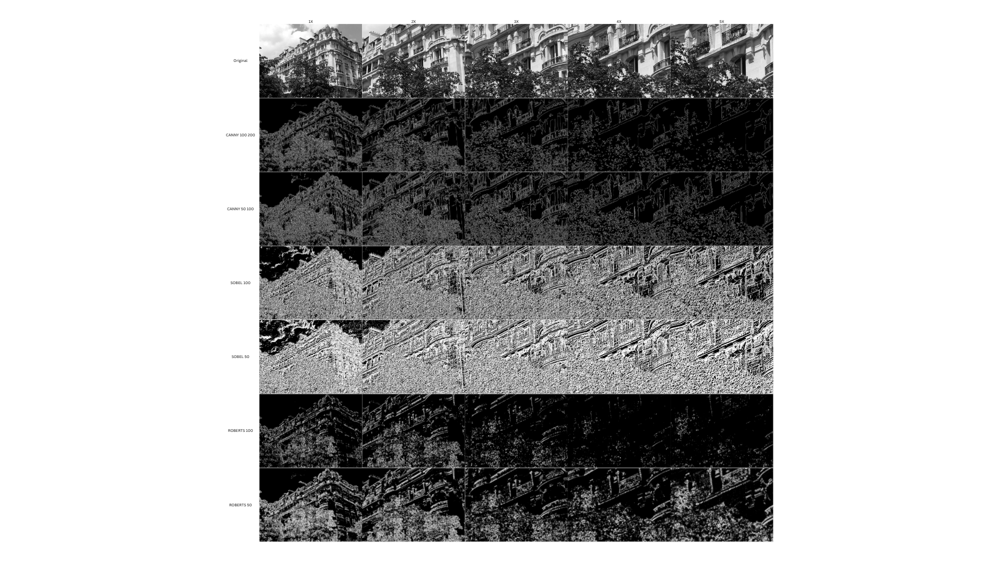

### Comentários finais:
#### Imagens Originais e Escalas

- A geração de escalas permitiu visualizar os efeitos de zoom-in (escala > 1) e zoom-out (escala < 1, se fosse incluída).

- Em escala maior (zoom-in), os detalhes ficam mais evidentes, mas o número de pixels aumenta e pequenas variações de intensidade ficam mais perceptíveis para os detectores. Isso tende a gerar mais bordas (inclusive ruído).

- Em escala menor (zoom-out, menos pixels), as bordas ficam mais "suaves" e várias bordas finas podem desaparecer, pois se perdem ao reduzir a resolução.


---

#### Detector de Roberts

- O Roberts utiliza máscaras pequenas (2×2), logo é muito sensível a ruídos e pequenas variações na intensidade.

- Em limites baixos de τ = 50, aparece bastante ruído, especialmente em superfícies com pequenas texturas.

- Com τ = 100, parte do ruído é removida, mas também perde-se contorno de detalhes finos (bordas de janelas, detalhes arquitetônicos).

- Ele tende a gerar bordas mais fragmentadas e menos contínuas.


---

#### Detector de Sobel

- O Sobel utiliza máscaras maiores (3×3), suavizando mais a imagem e respondendo melhor a gradientes.

- Em τ = 50, detecta muitas bordas, mas mantendo maior continuidade do que Roberts.

- Em τ = 100, ainda preserva os contornos principais (ex.: borda de prédios, telhado), mas elimina detalhes menores.

- Comparado a Roberts, o Sobel reduz ruído e produz bordas mais fortes e “limpas”, embora possa engordar um pouco as linhas.


---

#### Detector de Canny

- O Canny é mais sofisticado: aplica suavização Gaussiana + gradiente + supressão de não-máximos + histerese (usa dois limiares).

- Para limiares (50, 100):
	- Detecta bordas muito mais finas e definidas.

	- Mantém continuidade mesmo em contornos mais longos (linhas de paredes, telhado).


- Para limiares (100, 200):
	- As bordas ficam ainda mais limpas e restritas apenas às mais fortes, praticamente eliminando ruído.

	- Entretanto, alguns detalhes secundários da cena somem, restando somente os contornos estruturais principais do prédio.



---

#### Comparação Geral

- Roberts → Rápido e simples, mas muito sensível a ruídos, gera bordas fragmentadas.

- Sobel → Um bom equilíbrio: mais robusto, gera bordas fortes e contínuas, adequado quando não se precisa de sofisticação.

- Canny → Melhor qualidade entre os três: bordas finas, contínuas e bem localizadas, com tratamento extra de ruído. É o que mais se aproxima de uma extração limpa de contornos estruturais.


---

#### Conclusão:

- Escala: quanto maior o zoom, mais bordas e ruídos aparecem; quanto menor, mais se perdem detalhes.

- Limiar: limiares baixos capturam muitos detalhes (inclusive ruído), enquanto limiares altos extraem apenas bordas fortes.

- Comparação: Canny > Sobel > Roberts em termos de robustez e precisão.


## d)
Implemente o algoritmo CORNERS (mostrado nos slides) e use uma interface que mostre os cantos superpostos às imagens originais. Construa uma imagem sintética com um quadrado branco sobre um fundo preto e teste o algoritmo. Compare os resultados com o algoritmo de Harris, nas mesmas imagens. Em seguida use a imagem disponível no site do curso (building2-1.png). Rode a função icorner no Matlab, fornecida pela Machine Vison ToolBox que pode ser baixada do site www.petercorke.com (algoritmo de detector de cantos de Harris) ou qualquer outra função que realize operação semelhante, sobre a mesma imagem (o limiar tem de ter escolha adequada para fazer comparação com os outros algoritmos). Faça o mesmo para os métodos SURF (pode ser o ORB que é de livre instalação. O SURF pode ter restrições na versão free) e SIFT na plataforma que você estiver utilizando. Discuta os resultados.

In [ ]:
import cv2
import numpy as np
from PIL import Image
from skimage.transform import resize

def image_to_array(file, width=None, height=None):
    if file.lower().endswith(".npz"):
        # Carregar npz
        data = np.load(file)
        # se tiver a chave "resultado", usa ela. Se não, pega a primeira existente
        arr = data["resultado"] if "resultado" in data else data[list(data.keys())[0]]

        # garantir dtype float64
        np_img = np.array(arr, dtype=np.float64)

        if width is not None and height is not None:
            # Se precisar forçar resize (padrão igual ao das imagens PIL)
            if (np_img.shape[1], np_img.shape[0]) != (width, height):
                np_img = resize(
                    np_img, (height, width, np_img.shape[2]), preserve_range=True
                ).astype(np.float64)

    else:
        # Imagem regular
        img = Image.open(file).convert("RGB")
        if width is not None and height is not None:
            img = img.resize((width, height))
        np_img = np.array(img, dtype=np.float64)

    return np_img


def save_image(output, name, img_type):
    name = f"{name}.{img_type}"
    if img_type.lower() == "npz":
        np.savez_compressed(name, resultado=output)
    else:
        output = np.clip(output, 0, 255).astype(np.uint8)
        # Salva a imagem média
        if len(output.shape) == 2:
            img_final = Image.fromarray(output, mode="L")
        else:
            img_final = Image.fromarray(output, mode="RGB")
        img_final.save(name)
    print(f"Imagem salva como {name}")

def gradients(img, N):
    Ix = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)  # Derivada em x
    Iy = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)  # Derivada em y

    Ix2 = Ix * Ix
    Iy2 = Iy * Iy
    Ixy = Ix * Iy

    # Suavização
    ksize = 2 * N + 1
    Sx2 = cv2.GaussianBlur(Ix2, (ksize, ksize), 1)
    Sy2 = cv2.GaussianBlur(Iy2, (ksize, ksize), 1)
    Sxy = cv2.GaussianBlur(Ixy, (ksize, ksize), 1)
    return Sx2, Sy2, Sxy

def corners_detector(img, N=3, tau=1e-4):
    # 1. Converter para escala de cinza (caso seja RGB)
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img

    gray = np.float32(gray) / 255.0
    h, w = gray.shape

    # 2. Gradientes
    Sx2, Sy2, Sxy = gradients(gray, N)

    # Resposta λ2 em cada pixel
    lambda2 = np.zeros((h, w))
    pontos = []

    # 2. Para cada pixel p
    for y in range(h):
        for x in range(w):
            # a) Construir matriz C
            C = np.array([[Sx2[y, x], Sxy[y, x]], [Sxy[y, x], Sy2[y, x]]])

            # b) Calcular menor autovalor
            eigvals = np.linalg.eigvalsh(C)
            l2 = np.min(eigvals)
            lambda2[y, x] = l2

            # c) Testar com τ
            if l2 > tau:
                pontos.append((y, x, l2))

    # 3. Ordenar lista em ordem decrescente de λ2
    pontos.sort(key=lambda p: p[2], reverse=True)

    # 4. Supressão de não máximos: evitar vizinhanças sobrepostas
    final_points = []
    marcado = np.zeros((h, w), dtype=bool)

    for (y, x, val) in pontos:
        if not marcado[y, x]:
            final_points.append((y, x, val))
            # marcar vizinhança como ocupada
            y1, y2 = max(0, y - N), min(h, y + N + 1)
            x1, x2 = max(0, x - N), min(w, x + N + 1)
            marcado[y1:y2, x1:x2] = True

    return final_points, lambda2


# ============================================================
# Imagem Sintética
# ============================================================
img_synthetic = np.zeros((200, 200), dtype=np.uint8)
cv2.rectangle(img_synthetic, (50, 50), (150, 150), 255, -1)

corners, response = corners_detector(img_synthetic, N=3, tau=1e-4)

# Visualização
img_color = cv2.cvtColor(img_synthetic, cv2.COLOR_GRAY2BGR)
for y, x, val in corners:
    cv2.circle(img_color, (x, y), 3, (0, 0, 255), -1)

# Salvar resultados
save_image(img_color, "synthetic_corners", "png")
save_image(response, "synthetic_lambda2", "npz")

# --- Harris ---
harris = cv2.cornerHarris(np.float32(img_synthetic) / 255.0, 2, 3, 0.04)
harris_img = cv2.cvtColor(img_synthetic, cv2.COLOR_GRAY2BGR)
harris_img[harris > 0.01 * harris.max()] = [0, 0, 255]
save_image(harris_img, "synthetic_harris", "png")
save_image(harris, "synthetic_response", "npz")

# --- ORB ---
orb = cv2.ORB_create()
kp_orb = orb.detect(img_synthetic, None)
orb_img = cv2.drawKeypoints(img_synthetic, kp_orb, None, color=(0, 255, 0))
save_image(orb_img, "synthetic_orb", "png")

# --- SIFT ---
sift = cv2.SIFT_create()
kp_sift, _ = sift.detectAndCompute(img_synthetic, None)
sift_img = cv2.drawKeypoints(img_synthetic, kp_sift, None, color=(255, 0, 0))
save_image(sift_img, "synthetic_sift", "png")


# ============================================================
# building2-1.png
# ============================================================
img = cv2.imread("building2-1.png", cv2.IMREAD_GRAYSCALE)


corners, response = corners_detector(img, N=3, tau=0.05)

# Visualização
img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
for y, x, val in corners:
    cv2.circle(img_color, (x, y), 3, (0, 0, 255), -1)

# Salvar resultados
save_image(img_color, "building_corners", "png")
save_image(response, "building_lambda2", "npz")

# --- Harris ---
harris = cv2.cornerHarris(np.float32(img) / 255.0, 2, 3, 0.04)
harris_img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
harris_img[harris > 0.01 * harris.max()] = [0, 0, 255]
save_image(harris_img, "building_harris", "png")
save_image(harris, "building_harris_response", "npz")

# --- ORB ---
orb = cv2.ORB_create()
kp_orb = orb.detect(img, None)
orb_img = cv2.drawKeypoints(img, kp_orb, None, color=(0, 255, 0))
save_image(orb_img, "building_orb", "png")

# --- SIFT ---
sift = cv2.SIFT_create()
kp_sift, _ = sift.detectAndCompute(img, None)
sift_img = cv2.drawKeypoints(img, kp_sift, None, color=(255, 0, 0))
save_image(sift_img, "building_sift", "png")

### Resultados:

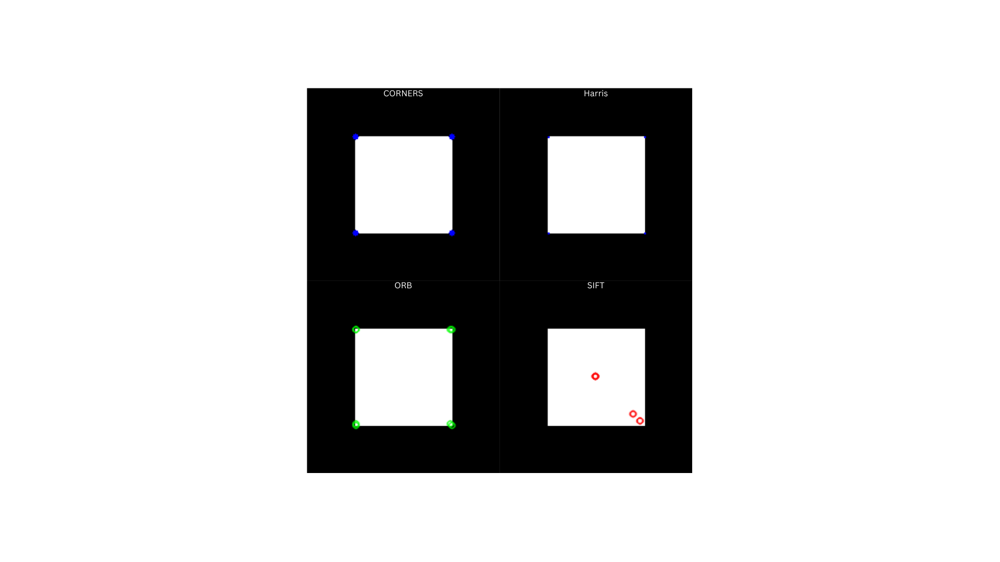

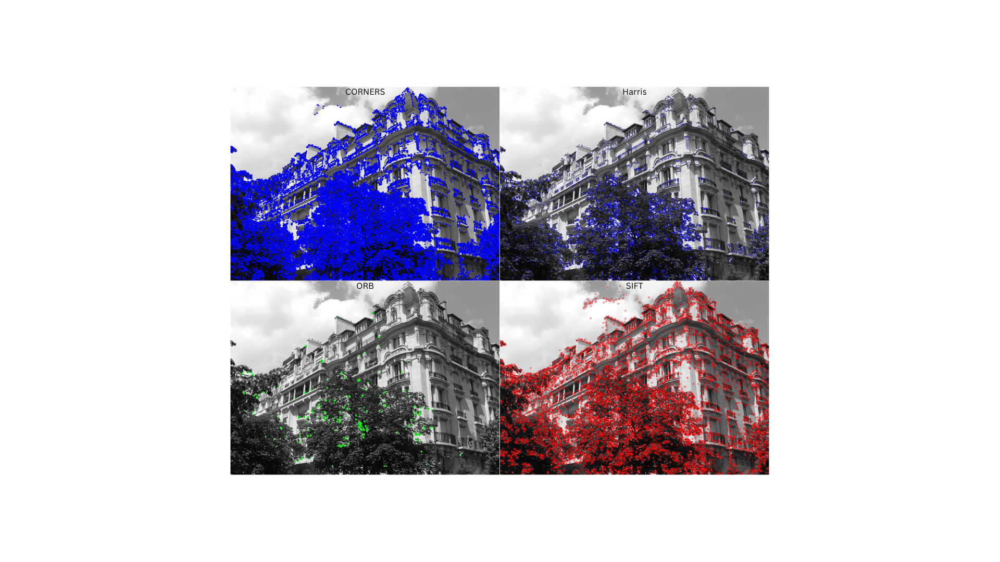

### Comentários finais:
#### Imagem sintética (quadrado branco em fundo preto)

##### Algoritmo CORNERS λ2:
- Detecta os quatro cantos do quadrado de forma bastante precisa.

- Como a estrutura é simples (alto contraste entre preto e branco), o autovalor mínimo da matriz de covariância de gradientes λ2 responde bem.

- Poucos pontos, localizados apenas nos cantos.


##### Harris:


- Também detecta corretamente os quatro vértices, mas pode marcar regiões na borda.

- Poucos pontos, localizados apenas nos cantos.


##### ORB (baseado em FAST + BRIEF):


- Detecta cantos, mas gera mais keypoints redundantes do que os algoritmos clássicos de canto.



##### SIFT:


- Detecta pontos de interesse multiescala, então além dos cantos, também pode marcar pontos no interior do quadrado (dependendo da vizinhança gaussiana analisada).

- Bom, mas claramente gera mais pontos que o necessário para essa imagem simples.

- No caso não achou os cantos


##### Resumo imagem sintética:

O CORNERS e Harris são mais seletivos e precisos (melhor para detectar vértices puros). Já ORB e SIFT marcam mais pontos, até redundantes, mas isso é uma vantagem quando pensamos em correspondência/robustez em imagens reais.


---

#### Imagem real (building2-1.png)


Aqui a análise fica mais interessante porque temos detalhes arquitetônicos com muitas estruturas de canto.


##### Algoritmo CORNERS:


- Detecta diversos pontos de interesse reais, mas tende a ser mais seletivo e não é multiescala.

- Detecta cantos bem definidos em janelas/prédios, mas pode perder detalhes em partes com textura mais fina.

- Como não possui normalização de escala, pode falhar em estruturas menores ou em cantos menos “puros”.


##### Harris:


- Responde muito bem nos contornos das janelas e bordas do edifício.

- Boa escolha quando o interesse é destacar apenas cantos pronunciados.


##### ORB:


- Detecta muitos keypoints espalhados pela cena (inclusive cantos menores, texturas repetitivas, detalhes finos).

- É eficiente, robusto e rápido, além de gerar descritores binários fáceis de usar em correspondência.


##### SIFT:


- Parecido com ORB, mas com maior diversidade de escalas e maior robustez a mudanças de contraste/iluminação.

- Gera keypoints bem distribuídos e estáveis em diferentes escalas.

- Excelente para aplicações de visão computacional robusta, como image stitching (costura de imagens de prédios).


##### Resumo imagem real:


- CORNERS/Harris: bons para detectar cantos principais, precisos mas não multiescala.

- ORB/SIFT: capturam muito mais detalhes e escalas diferentes, sendo mais adequados para tarefas práticas como reconhecimento e emparelhamento de imagens.


---

#### Comparação Geral

Algoritmo	Características principais	Resultado esperado
CORNERS	Baseado em λ2. Simples, seletivo e focado em detectar apenas cantos fortes	Pega cantos principais, mas perde em robustez multiescala
Harris	Similar ao CORNERS (usa R = det(C) - k·trace(C)²). Bom em cantos pronunciados, mas sensível ao threshold	Detecta cantos bem, mas também bordas redundantes
ORB	Detector + descritor rápido, multiescala, com descritores binários (FAST + BRIEF).	Muitos pontos de interesse, bom para matching
SIFT	Robustez em várias escalas, invariância a rotação, contraste e iluminação. Excelente, mas mais pesado.	Keypoints distribuídos e estáveis, excelente para aplicações reais

---
#### Conclusão:


- Em imagens sintéticas simples, CORNERS e Harris são mais limpos e precisos, detectando apenas os vértices.

- Em imagens reais e complexas, ORB e SIFT se destacam, pois capturam mais pontos de interesse em múltiplas escalas, o que os torna melhores para aplicações de reconhecimento, registro e matching de imagens.

- Assim, a escolha do detector depende do objetivo:
	- Se o objetivo é apenas detectar cantos puros → CORNERS/Harris. (O problema do CORNERS é que é muto lento, o Harris é mais rápido)

	- Se o objetivo é matching robusto entre imagens → ORB/SIFT.

.

.

.

.

.

.

# 2)

## a)
Explique quais efeitos você observaria em uma imagem caso a distância focal da lente seja
alterada para maior ou para menor.

### Resposta
Se aumentamos a distância focal:

- Ampliação da imagem → os objetos da cena parecem maiores e "mais próximos".

- Campo de visão menor → a câmera "enxerga" uma área menor da cena (zoom in).

- Profundidade de campo diminui → regiões fora do foco ficam mais borradas, ou seja, só uma faixa mais estreita de distâncias estará realmente nítida.

- Perspectiva comprimida → objetos distantes parecem mais próximos uns dos outros, "achatando" a percepção de profundidade.


---

Se diminuímos a distância focal:

- Menor ampliação → os objetos parecem menores e "mais distantes".

- Campo de visão maior → a câmera captura uma área muito mais ampla da cena (zoom out).

- Profundidade de campo aumenta → mais objetos a diferentes distâncias aparecem focados ao mesmo tempo.

- Perspectiva expandida → objetos próximos ficam bem maiores e os distantes parecem bem menores, aumentando a sensação de profundidade.


---

Resumindo os efeitos:

Distância Focal	Campo de Visão	Tamanho Aparente	Profundidade de Campo	Efeito na Perspectiva
Maior	Menor (estreito)	Objetos maiores	Menor (foco seletivo)	Cena "achatada"
Menor	Maior (amplo)	Objetos menores	Maior (mais foco)	Cena "alongada"

## b)
Explique o conceito de ruído em imagens, como pode ser quantificado, e como pode afetar
o processamento das imagens em visão computacional.

### Resposta

#### O que é ruído em imagens?


No contexto de Visão Computacional de Imagens, ruído é definido como qualquer variação ou informação indesejada que se mistura à imagem original, dificultando o cálculo, e assim impactando no resultado.

##### Ele pode surgir:

- Durante a aquisição da imagem (câmeras, sensores, transmissão, interferência eletromagnética);

- Durante o processamento digital (compressão, arredondamentos, erros numéricos);

- Por limitações físicas (grão em filmes fotográficos, iluminação não uniforme).

- Mas também pode ser só algo que veio de outro passo que atrapalha o passo atual, ou que não é de interesse para o cálculo atual.

##### Ele pode ser:

- flutuações espúrias nos valores de pixels introduzidas pelo sistema de aquisição de imagens, afetando a detecção de linhas ou contornos em algoritmos de processamento;

- variações aleatórias ou imprecisões nos dados de entrada, incluindo erros de precisão numérica e arredondamentos;

- contornos inexistentes, isto é, que não correspondem a nenhum objeto real, em algoritmos de agrupamento de linhas.

Matematicamente, uma imagem com ruído pode ser descrita como:

$$Î(i,j) = I(i,j) + n(i,j)$$

onde:


- Imagem corrompida (com ruído): $$Î(i,j)$$

- Imagem ideal (sem ruído): $$I(i,j)$$

- Ruído aditivo e aleatório: $$n(i,j)$$

Em alguns casos, o ruído pode ser multiplicativo:

$$Î(i,j) = I(i,j) \cdot n(i,j)$$


#### Quantificação do ruído:

Um parâmetro importante é a Relação Sinal-Ruído (SNR):

$$SNR = \frac{\mu_s}{\sigma_n}$$

$$SNR_{dB} = 10 \cdot \log_{10}\left(\frac{\mu_s}{\sigma_n}\right)$$
ou
$$SNR_{dB} = 20 \cdot \log_{10}\left(\frac{\mu_s}{\sigma_n}\right)$$
onde:


- Média do sinal (valores médios dos pixels da imagem original): $$\mu_s$$

- Desvio padrão do ruído: $$\sigma_n$$

Então:

- Quanto maior o SNR, melhor a qualidade da imagem (menos ruído em relação ao sinal).

- Quanto menor o SNR, mais contaminada a imagem está.


#### Como o ruído afeta o processamento de imagens


O ruído pode comprometer diretamente algoritmos de visão computacional. Exemplos:


- Detecção de bordas e contornos: pequenas flutuações podem ser confundidas com bordas falsas.

- Segmentação: regiões homogêneas ficam “quebradas” pelo ruído.

- Reconhecimento de padrões: objetos podem ser mal identificados devido à presença de artefatos.

- Compressão: taxas de erro aumentam, pois o ruído ocupa espaço de codificação.

Ou seja, quanto mais ruído, menos confiáveis são os resultados.

## c)
Explique por que a precisão de amostragem de um filtro Gaussiano 1-D com 𝜎 = 0,6 não pode ser melhorada utilizando mais de três amostras espaciais (largura espacial maior que 3
pixels).

### Resposta
1. Máscara Gaussiana e relação entre 𝑤' e 𝜎'

- A largura da máscara Gaussiana normalmente é escolhida como


$$w = 5 \cdot \sigma$$
$$5 / \sigma <= 2 \cdot \pi$$
$$\sigma >= 5 / (2 \cdot \pi)$$
$$\sigma >\approx 0.8$$

pois nesse intervalo já está contida cerca de 98,76% da energia da Gaussiana.



Exemplo:


- Se \(w = 3\), então \(\sigma \approx 0,6\)

- Se \(w = 5\), então \(\sigma \approx 1\)



---

2. Limite de resolução no domínio da frequência


A transformada de Fourier de uma Gaussiana é também uma Gaussiana, mas no domínio da frequência:

$$\text{T.F.}\{ g(x, \sigma) \} = g(x', \sigma')$$
onde:
$$\sigma' = \frac{1}{\sigma}$$

Assim:


- Quanto menor 𝜎 no espaço, mais larga é a Gaussiana em frequência.

- Isso significa que filtros Gaussianos de 𝜎 pequeno possuem muitos componentes de alta frequência.

Porém, devido à amostragem espacial (1 pixel como passo de amostragem), o máximo componente de frequência perceptível é:

$$\nu_c = \frac{\pi}{d}, \quad d = 1 \text{ pixel}$$

Logo, frequências maiores que 𝜋 não podem ser representadas corretamente — sofrem aliasing ou simplesmente se perdem.


---

3. Por que aumentar a largura (w > 3) não melhora a precisão em 𝜎 = 0,6

- Para 𝜎 = 0,6 (caso w=3):


	- A Gaussiana no domínio da frequência já tem bastante energia além do intervalo [-𝜋, 𝜋].

	- Ou seja, mesmo que você aumente a largura (w) no espaço (mais amostras), as frequências perdidas não são recuperáveis porque estão fora da banda perceptível (além de 𝜋).


- Se você tentar usar w=5 (isto é, máscara mais larga com mesmo 𝜎=0,6):


	- O valor das novas amostras adicionadas (nas extremidades) é próximo de zero (porque a Gaussiana decai muito rápido em ±2.1𝜎).

	- Portanto, essas amostras extras não trazem informação significativa.

	- O resultado numérico é praticamente idêntico ao filtro com w=3.



---

4. Conclusão


A precisão não melhora porque:


1. No espaço: a contribuição fora da janela de 3 amostras já é praticamente nula devido à concentração da Gaussiana.

2. No domínio da frequência: aumentar w não traz de volta as frequências já perdidas, que estão além de ±𝜋.

Portanto, para 𝜎 = 0,6, já é suficiente uma máscara de largura w = 3. Usar mais amostras só aumenta o custo computacional sem melhorar a aproximação.



## d)
Dadas as definições e classificações de bordas, discuta as diferenças entre bordas em imagens de intensidade e de profundidade. Quais as diferenças nos algoritmos para detectá-las e localizá-las?

### Resposta
#### Bordas em Imagens de Intensidade

##### Definição:

São regiões da imagem em que existe uma variação brusca de intensidade luminosa (valores de cinza ou cor).

Exemplo: contorno de um objeto iluminado, sombra projetada, mudança de textura.

##### Fonte da Informação:

A intensidade é derivada do processo fotométrico (iluminação + refletância da superfície + captura pela câmera).

Isso significa que as bordas de intensidade podem refletir não apenas transições reais de objetos, mas também efeitos de iluminação (sombras, reflexos, brilho, texturas).

Pode também ser gerado computacionalmente através de renderização de uma cena 3d.

##### Modelo matemático:

Normalmente representamos a intensidade como uma função I(x, y).

As bordas aparecem onde o gradiente (primeira derivada) é máximo:

$$\nabla I(x, y) = \left(\frac{\partial I}{\partial x}, \frac{\partial I}{\partial y}\right)$$
A magnitude do gradiente dá a “força” da borda, e sua orientação dá a direção.

##### Algoritmos típicos:


- Filtros de gradiente: Roberts, Prewitt, Sobel.

- Detectores baseados em suavização + gradiente: Canny.

- Métodos de zero-crossing: Laplaciano do Gaussiano (LoG).

---

#### Bordas em Imagens de Profundidade

São regiões em uma imagem de profundidade (Depth Map) ou em um modelo 3D reconstruído, onde ocorre variação brusca de distância (Z em relação à câmera).

Exemplo: borda de descontinuidade profunda (ângulo de uma caixa vista pela câmera) ou mudança no plano da cena.

##### Fonte da Informação:

Diferente das bordas de intensidade, agora a informação vem de um sensor de profundidade (ex.: câmera estéreo, LiDAR, Kinect, estrutura de luz).

Logo, as bordas correspondem mais diretamente à geometria real da cena, e não são tão influenciadas pela iluminação.

Pode também ser gerado computacionalmente através de renderização de uma cena 3d.

##### Modelo matemático:

Representamos a profundidade como D(x, y).

As bordas aparecem onde o gradiente de profundidade é elevado:


$$\nabla D(x, y) = \left(\frac{\partial D}{\partial x}, \frac{\partial D}{\partial y}\right)$$

Além disso, também podem ser detectadas descontinuidades em superfícies planas, onde não há uma transição suave, mas sim uma quebra abrupta na profundidade.

##### Algoritmos típicos:


- Gradiente da profundidade (semelhante a intensidade, mas aplicado ao mapa de profundidade).

- Detecção de descontinuidades (thresholding no gradiente de profundidade).

- Cálculo de normais de superfície: mudanças bruscas nas normais definem bordas geométricas.

- Métodos baseados em ajuste de planos locais (detectar onde o plano não se ajusta mais bem — quinas e arestas).

---

#### Principais Diferenças entre Bordas de Intensidade e de Profundidade

Aspecto	Bordas de Intensidade	Bordas de Profundidade
Origem	Fotometria (mudança de luz, textura, cor, sombra, refletância).	Geometria (mudança no valor de profundidade real).
Sensibilidade a condições externas	Muito sensíveis à iluminação, sombras, reflexos.	Menos dependentes de iluminação, mas sensíveis a ruído do sensor de profundidade.
Algoritmo básico	Gradiente da intensidade I(x, y), suavização + derivadas.	Gradiente da profundidade D(x, y), descontinuidade da geometria ou mudança abrupta de normal.
Ruído	Ruído fotométrico (granulação, compressão da imagem, baixa iluminação).	Ruído de range sensing (erros de disparidade em estéreo, ruído estrutural em Kinect ou LiDAR).
Resultado esperado	Pode detectar bordas falsas causadas por sombras/texturas.	Mais fiel às bordas estruturais dos objetos na cena.

---

#### Resumindo

- Em intensidade, borda ≈ forte variação de níveis de cinza (dependente de iluminação e textura).

→ Algoritmos: gradiente, Canny, Sobel, LoG.

- Em profundidade, borda ≈ descontinuidade geométrica (mudança brusca de Z ou de normais de superfície).

→ Algoritmos: gradiente de profundidade, detecção de descontinuidades, análise de normais.

Ou seja:

- Bordas em intensidade dependem de luz → podem confundir sombra com objeto.

- Bordas em profundidade dependem de geometria real → mas sofrem com ruído estrutural do sensor.

## e)
Explique por que a segmentação H-K não pode ser aplicada a imagens de intensidade na expectativa de se encontrarem cenas de superfícies homogêneas.

### Resposta

A segmentação H-K baseia-se em conceitos de geometria diferencial e requer que cada ponto da imagem represente uma coordenada no espaço 3D, ou seja, um ponto sobre uma superfície definida como (x, y, z).

- Em imagens de intensidade (RGB ou em tons de cinza), cada pixel só carrega valores de intensidade da luz refletida (ou luminosidade da cena), sem nenhuma correspondência direta com altura/profundidade.

- A técnica precisa da informação de profundidade (terceira dimensão) para que seja possível calcular as derivadas parciais da superfície (como $$h_x, h_y, h_{xx}, h_{yy}, h_{xy}$$) que permitem estimar as curvaturas média (H) e gaussiana (K).

- Em uma imagem de intensidade, não existe superfície explícita a ser diferenciada — só existem variações de brilho que não correspondem diretamente a variações geométricas da forma no espaço 3D.

Por isso:

- Se tentamos aplicar H-K em imagens de intensidade, estaríamos medindo "curvatura" sobre o campo 2D de brilho, e não da superfície real do objeto.

- Regiões homogêneas em intensidade não correspondem necessariamente a regiões planas no espaço físico. Um objeto com a mesma cor, mas com relevos diferentes, teria uma intensidade homogênea mas não seria plano em 3D.

- Da mesma forma, diferenças de iluminação ou sombras podem gerar fortes variações de intensidade, que não têm nada a ver com curvatura real da superfície.


---
Resposta resumida:

A segmentação H-K não pode ser aplicada diretamente em imagens de intensidade porque não existe relação direta entre variações de intensidade e curvaturas geométricas da superfície. A técnica depende de informações de profundidade z = h(x,y) para que seja possível calcular as curvaturas locais (H e K). Em intensidade, só temos brilho/luminosidade, e não a forma 3D, logo não é possível identificar corretamente regiões homogêneas da superfície.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.